In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("final_clean_df.csv", index_col=0)

In [3]:
df

,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics
0,rock,into the storm,Gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...
1,rock,the sound of silence,Disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i've come to talk...
2,rock,amazonia,Gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...
3,rock,back in black,AC/DC,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i've been too lon...
4,rock,another world,Gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11398,hiphop,let me know,Cam'Ron,True,4.14,F#,Major,92,75,69,35,79,33,F#,all my harlem niggas my bk niggas back uptown ...
11399,hiphop,lyrical gangbang,Dr. Dre,True,4.04,F#,Major,81,82,68,13,83,27,F#,this should be played at high volume preferabl...
11400,hiphop,just like candy,8-Ball & MJG,True,4.19,G,Major,95,68,39,13,72,8,G,just like candy candy just like candy its the ...
11401,hiphop,beta,Tyson James,False,3.54,G,Major,89,73,58,28,57,45,G,verse topher oh boy catch me walking through ...


d:\idan\python\genre_prediction_data_science\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Genre', ylabel='count'>

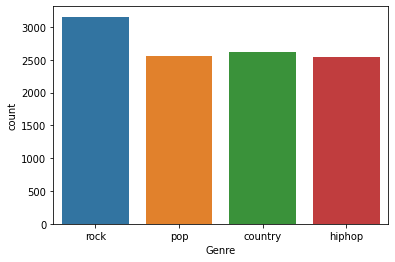

In [4]:
sns.countplot(df['Genre'])

In [5]:
profile_df = ProfileReport(df, title='Pandas Profiling Report')
profile_df

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
import nltk, spacy
from nltk.corpus import stopwords

nlp = spacy.load('en_core_web_sm')
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\idan9\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\idan9\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [7]:
def lemSentence(sentence):
    doc = nlp(sentence)
    tokens = []
    for token in doc:
        tokens.append(token)
    return " ".join([token.lemma_ for token in doc])

Words visual for rock: 



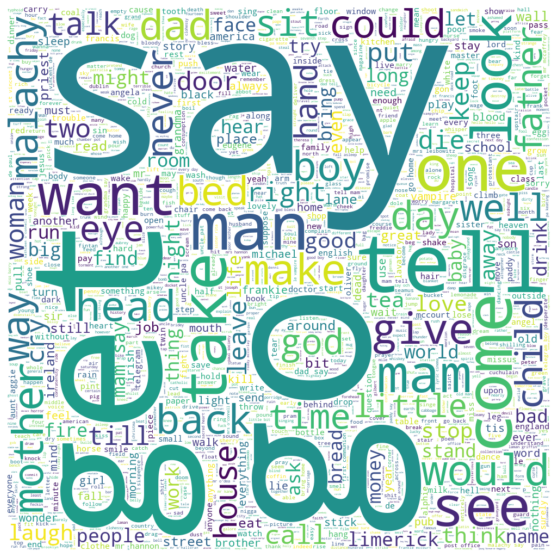

------------
Words visual for pop: 



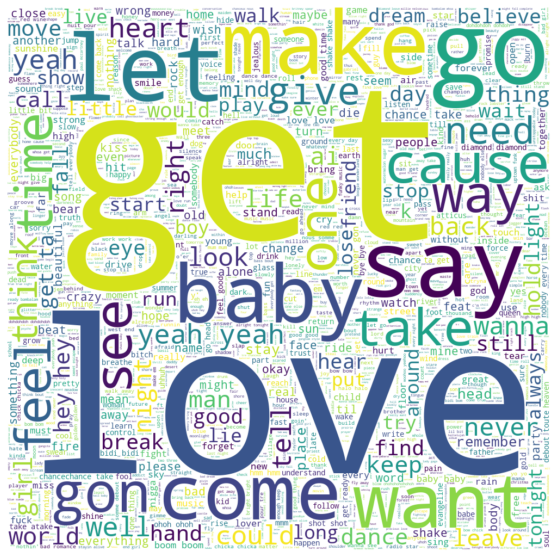

------------
Words visual for country: 



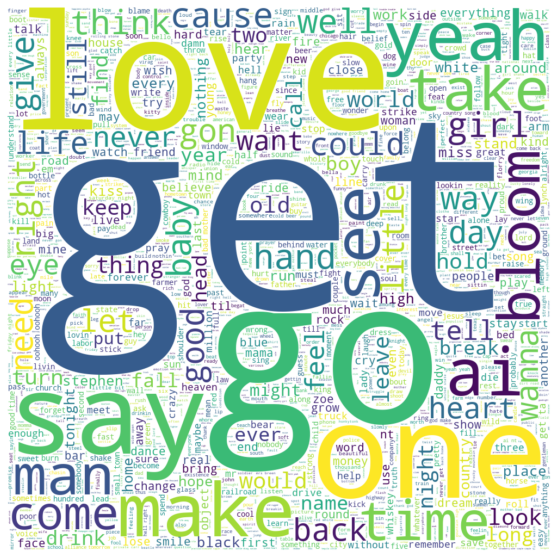

------------
Words visual for hiphop: 



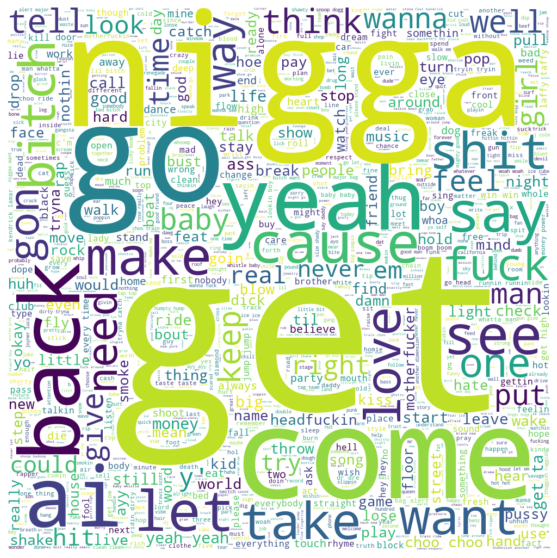

------------


In [12]:
genres = df.Genre.drop_duplicates().values.tolist()
customStopWords = ["'s", "n't", "'m", "'re", "'ll", "'ve", "...", "ä±", "''", '``',
                   '--', ',', "'d", 'el', 'la', 'chorus', 'know', 'verse', 'oh', 'la', 'ya', 'na', 'wo', 'wan',
                   'Chorus', 'Verse',
                   'ca', 'cuz', '[Verse 1:]', 'got', '[Intro:]', '[Chorus]', '\n', 's', 't', 'n', 'don',
                   'ya', 'aah', 'ye', 'ba', 'da', 'buh', "like", 'duh', 'doo', 'oh', 'ooh', 'woo', 'uh', 'hoo', 'ah',
                   'oo', 'la', 'chorus', 'beep', 'ha', "get'", "like'"]
stopWords = stopwords.words('english') + customStopWords
for genre in genres:
    print(f"Words visual for {genre}: \n")
    words = " ".join(df[df["Genre"] == genre]["Lyrics"])
    words = lemSentence(words[:1000000])
    wc = WordCloud(background_color="white", stopwords=stopWords, max_words=2000, width=1000, height=1000)
    wc.generate(words)
    plt.figure(figsize=[10, 10])
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.savefig(f"./{genre}_cloud.png")
    plt.show()
    print("------------")


In [13]:
'''
As you can see, we got a LOT of common words so I'll add them to stopwords
so we can see the very different lyrics
such as: "see","one","say","love","i'm","im",
'''

'\nAs you can see, we got a LOT of common words so I\'ll add them to stopwords\nso we can see the very different lyrics\nsuch as: "see","one","say","love","i\'m","im",\n'

Words visual for rock: 



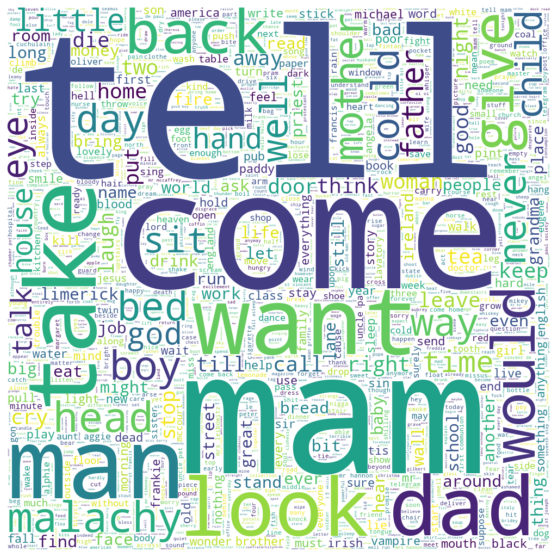

------------
Words visual for pop: 



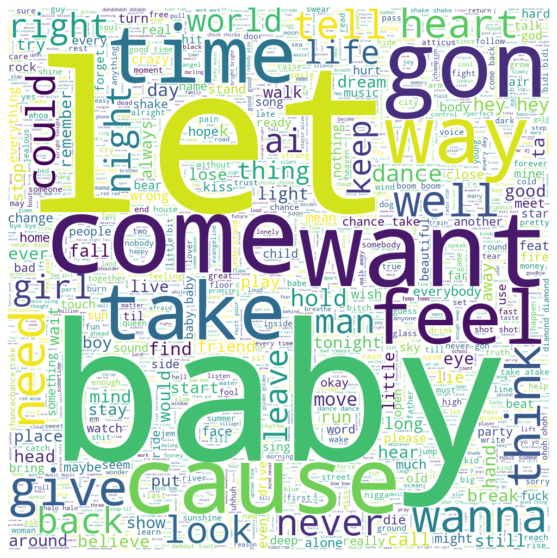

------------
Words visual for country: 



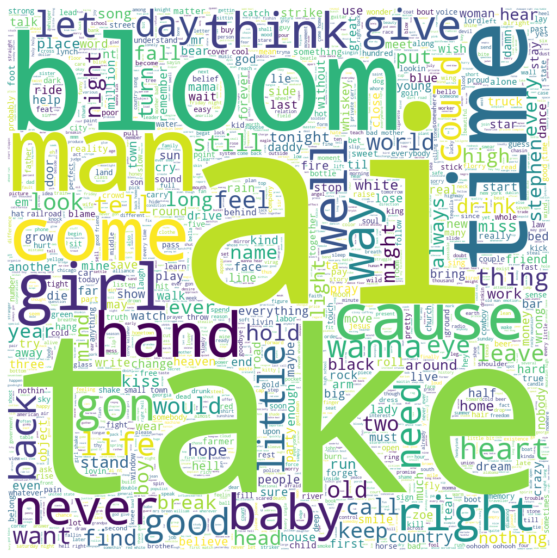

------------
Words visual for hiphop: 



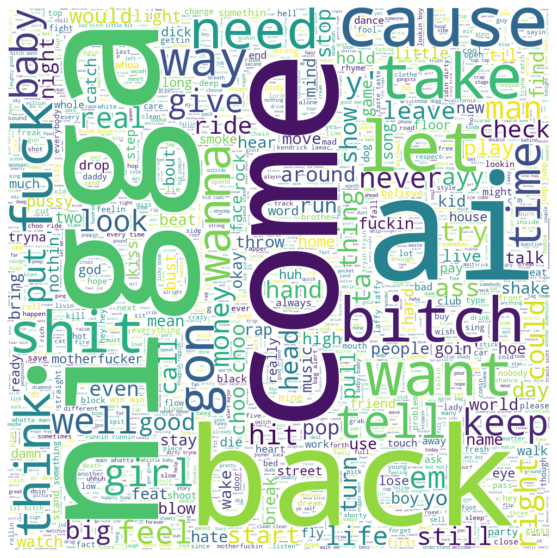

------------


In [87]:
genres = df.Genre.drop_duplicates().values.tolist()
customStopWords = ["yeah","see", 'make',"get", "go", "one", "say", "love", "i'm", "im", "'s", "n't", "'m", "'re", "'ll", "'ve", "...",
                   "ä±", "''", '``',
                   '--', ',', "'d", 'el', 'la', 'chorus', 'know', 'verse', 'oh', 'la', 'ya', 'na', 'wo', 'wan',
                   'Chorus', 'Verse',
                   'ca', 'cuz', '[Verse 1:]', 'got', '[Intro:]', '[Chorus]', '\n', 's', 't', 'n', 'don',
                   'ya', 'aah', 'ye', 'ba', 'da', 'buh', "like", 'duh', 'doo', 'oh', 'ooh', 'woo', 'uh', 'hoo', 'ah',
                   'oo', 'la', 'chorus', 'beep', 'ha', "get'", "like'"]
stopWords = stopwords.words('english') + customStopWords
for genre in genres:
    print(f"Words visual for {genre}: \n")
    words = " ".join(df[df["Genre"] == genre]["Lyrics"])
    words = lemSentence(words[:1000000])
    wc = WordCloud(background_color="white", stopwords=stopWords, max_words=2000, width=1000, height=1000)
    wc.generate(words)
    plt.figure(figsize=[10, 10])
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.savefig(f"./{genre}_cloud.png")
    plt.show()
    print("------------")

<AxesSubplot:>

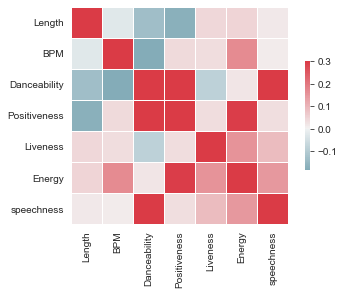

In [88]:

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df[['Length', 'BPM', 'Danceability', 'Positiveness', 'Liveness', 'Energy', 'speechness']].corr(), vmax=.3,
            center=0, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [89]:
pd.pivot_table(df, index=['Genre'], values=['Length', 'BPM', 'Danceability', 'Positiveness', 'Liveness', 'Energy',
               'speechness'])


,BPM,Danceability,Energy,Length,Liveness,Positiveness,speechness
Genre,,,,,,,
country,120.840320,58.003430,60.637195,3.319531,17.598323,55.857851,4.349085
hiphop,117.675039,73.781397,67.998430,3.732940,19.621272,53.936028,21.260989
pop,118.673573,61.271306,61.399531,3.624715,17.935496,56.160672,6.100469
rock,123.883397,52.227186,71.099493,3.973577,19.279468,53.520279,5.762674


In [90]:
df["Lyrics_Length"]=df.Lyrics.apply(lambda x: int(len(x.split(" "))))

<AxesSubplot:xlabel='Genre', ylabel='Lyrics_Length'>

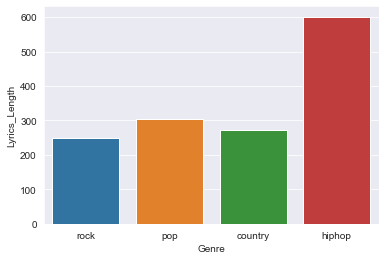

In [91]:
import numpy as np
# who v/s fare barplot
sns.barplot(x = 'Genre',
            y = 'Lyrics_Length',
            data = df,
            estimator = np.median,
            ci = 0)

In [92]:

df

,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics,Lyrics_Length
0,rock,into the storm,Gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...,169
1,rock,the sound of silence,Disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i've come to talk...,217
2,rock,amazonia,Gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...,150
3,rock,back in black,AC/DC,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i've been too lon...,261
4,rock,another world,Gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11398,hiphop,let me know,Cam'Ron,True,4.14,F#,Major,92,75,69,35,79,33,F#,all my harlem niggas my bk niggas back uptown ...,744
11399,hiphop,lyrical gangbang,Dr. Dre,True,4.04,F#,Major,81,82,68,13,83,27,F#,this should be played at high volume preferabl...,637
11400,hiphop,just like candy,8-Ball & MJG,True,4.19,G,Major,95,68,39,13,72,8,G,just like candy candy just like candy its the ...,568
11401,hiphop,beta,Tyson James,False,3.54,G,Major,89,73,58,28,57,45,G,verse topher oh boy catch me walking through ...,725
